In [1]:
import pandas as pd
import geopandas as gpd
import folium
import matplotlib.pyplot as plt

od17 = pd.read_csv("trips_od17_bikes_all.csv")

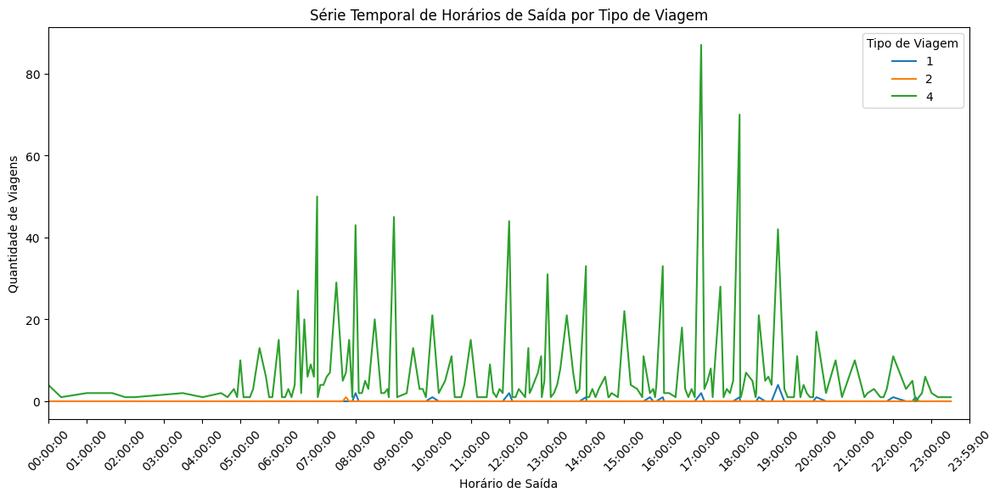

In [2]:
def por_tipo(od17):
    od17['TO_DATE_TIME'] = pd.to_datetime(od17['HORA_SAIDA'], format='%H:%M:%S').dt.time

    plt.figure(figsize=(14, 6))

    grouped = od17.groupby(['TO_DATE_TIME', 'TIPVG']).size().unstack(fill_value=0)
    grouped.plot(kind='line', ax=plt.gca())

    time_intervals = pd.date_range(start='00:00', end='23:59', freq='60min').time
    time_intervals = [time.strftime('%H:%M:%S') for time in time_intervals] + ['23:59:00']

    plt.xticks(ticks=time_intervals, labels=time_intervals, rotation=45)
    plt.xlim([time_intervals[0], time_intervals[-1]])
    plt.title('Série Temporal de Horários de Saída por Tipo de Viagem')
    plt.xlabel('Horário de Saída')
    plt.ylabel('Quantidade de Viagens')
    plt.legend(title='Tipo de Viagem')
    plt.show()

por_tipo(od17)


<h2>Origem e Destino</h2>

In [9]:
zonas = gpd.read_file('OD-2017\Mapas-OD2017\Shape-OD2017\Zonas_2017_region.shp')

map = folium.Map(location = [-23.5789, -46.6388], tiles = "CartoDB Positron", zoom_start = 10)

folium.GeoJson(zonas, style_function = lambda feature: {
            'weight': 1,
            'color': 'blue',
            'fillOpacity': 0,
            },
            name = 'zonas').add_to(map)

display(map)